In [1]:
listy = []

#DO NOT RUN THIS CELL

In [2]:
import pandas as pd
from urllib.request import urlopen
from bs4 import BeautifulSoup
from urllib.request import Request, urlopen
import re
from datetime import datetime
import plotly.express as px
from IPython.display import display, HTML  
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
from matplotlib import rc
import tensorflow
import sklearn
pd.set_option('mode.chained_assignment', None)  

#importing relevant libraries - these are added on an when needed basis and always in this cell

# Import and Scrape Covid-19 and Index Data

### Covid-19

In [3]:
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
confirmed = pd.read_csv(url, error_bad_lines=False)

#importing confirmed cases data - SOURCE: John Hopkins University

In [4]:
url1 = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
deaths = pd.read_csv(url1, error_bad_lines=False)

#importing deaths data - SOURCE: John Hopkins University

In [5]:
url2 = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv'
recovered = pd.read_csv(url2, error_bad_lines=False)

#importing confirmed recoveries data - SOURCE: John Hopkins University

### Index Data

In [6]:
req = Request('https://uk.investing.com/indices/major-indices', headers={'User-Agent': 'Mozilla/5.0'})
indices = urlopen(req).read()

#scraping live index data - SOURCE: https://uk.investing.com

In [7]:
soup = BeautifulSoup(indices, 'lxml')
type(soup)

#parse HTML file

bs4.BeautifulSoup

In [8]:
rows = soup.find_all('tr')

#parse HTML file

In [9]:
for row in rows:
    row_td = row.find_all('td')
    
#parse HTML file

In [10]:
str_cells = str(row_td)

#parse HTML file

In [11]:
cleantext = BeautifulSoup(str_cells, "lxml").get_text()

#parse HTML file

In [12]:
list_rows = []
for row in rows:
    cells = row.find_all('td')
    str_cells = str(cells)
    clean = re.compile('<.*?>')
    clean2 = (re.sub(clean, '',str_cells))
    list_rows.append(clean2)
    
#parse HTML file

In [13]:
col_labels = soup.find_all('th')
df = pd.DataFrame(list_rows)

#parse HTML file

In [14]:
df1 = df[0].str.split(', ', expand=True)

#splitting string into separate columns

In [15]:
df1 = df1[[1,2,3,4,5,6,7]]

#trimming down to desired columns

In [16]:
col_labels = soup.find_all('th')
all_header = []     
col_str = str(col_labels)
cleantext2 = BeautifulSoup(col_str, "lxml").get_text()
all_header.append(cleantext2)
df2 = pd.DataFrame(all_header)
df3 = df2[0].str.split(',', expand=True)
df3 = df3[[1,2,3,4,5,6,7]]

#parse and extract column headers from original table to add to data columns as column headers

In [17]:
frames = [df3, df1]
df4 = pd.concat(frames)

#combine headers and data tables

In [18]:
new_header = df4.iloc[0] 
df4 = df4[2:] 
df4.columns = new_header

#make headers column headers

In [19]:
df4.columns = df4.columns.str.replace(' ', '')

#get rid of whitespace

In [20]:
df4['Index'] = df4['Index'].str.replace('&amp;', '&') 

#clean up index name strings

In [21]:
df4 = df4[0:42] 

#select only indices I am interested in

In [22]:
df4.index.name = datetime.today().strftime('%Y-%m-%d')
df4 = df4.rename(columns={"Time": datetime.today().strftime('%Y-%m-%d')})

#put date on dataframe to have record of when this data was scraped

In [23]:
df4.set_index('Index', inplace=True)
df4.head(10)

#display formatted dataframe as is on the website with date of snapshot indicated in final column

,Last,High,Low,Chg.,Chg.%,2020-04-02
Index,,,,,,
Dow 30,"20,943.51","21,487.24","20,784.43",-973.65,-4.44%,01/04
S&P 500,"2,470.50","2,522.75","2,447.49",-114.09,-4.41%,01/04
Nasdaq,"7,360.58","7,566.37","7,301.98",-339.52,-4.41%,01/04
SmallCap 2000,"1,068.24","1,127.73","1,064.60",-84.86,-7.36%,01/04
S&P 500 VIX,52.69,54.49,52.55,-4.37,-7.66%,13:02:04
S&P/TSX,"12,876.37","13,138.05","12,813.98",-502.38,-3.76%,01/04
Bovespa,"70,966.70","73,010.78","69,568.56",-2053.06,-2.81%,01/04
S&P/BMV IPC,"33,691.88","34,118.00","33,443.52",-862.65,-2.50%,01/04
DAX,"9,577.75","9,612.25","9,496.75",+33.00,+0.35%,13:02:17


In [24]:
listy.append(df4)

#important step that appends new data snapshot to a list of snapshots - creating a backlog of index data

In [25]:
CSS = """
.output {
    flex-direction: column;
}
"""

HTML('<style>{}</style>'.format(CSS))

#this is to be able to display mutliple dataframes in one output as in cell below

In [26]:
x = 0
for i in listy:
    display(i)
    x = x + 1

#each dataframe represents a daily snapshot of index data for all the major world indices

,Last,High,Low,Chg.,Chg.%,2020-04-02
Index,,,,,,
Dow 30,"20,943.51","21,487.24","20,784.43",-973.65,-4.44%,01/04
S&P 500,"2,470.50","2,522.75","2,447.49",-114.09,-4.41%,01/04
Nasdaq,"7,360.58","7,566.37","7,301.98",-339.52,-4.41%,01/04
SmallCap 2000,"1,068.24","1,127.73","1,064.60",-84.86,-7.36%,01/04
S&P 500 VIX,52.69,54.49,52.55,-4.37,-7.66%,13:02:04
S&P/TSX,"12,876.37","13,138.05","12,813.98",-502.38,-3.76%,01/04
Bovespa,"70,966.70","73,010.78","69,568.56",-2053.06,-2.81%,01/04
S&P/BMV IPC,"33,691.88","34,118.00","33,443.52",-862.65,-2.50%,01/04
DAX,"9,577.75","9,612.25","9,496.75",+33.00,+0.35%,13:02:17


# Time Series Visualisation of Covid-19 Data

In [27]:
just_data_confirmed = confirmed.drop(['Lat'], axis = 1) 
just_data_confirmed = just_data_confirmed.drop(['Long'], axis = 1)

just_data_deaths = deaths.drop(['Lat'], axis = 1) 
just_data_deaths = just_data_deaths.drop(['Long'], axis = 1)

just_data_recovered = recovered.drop(['Lat'], axis = 1) 
just_data_recovered = just_data_recovered.drop(['Long'], axis = 1)

#getting rid of latitude and longtitude columns as these are not needed for timeseries visualisation

In [28]:
sum_deaths_country = just_data_deaths.groupby(['Country/Region']).sum()
sum_deaths_country = sum_deaths_country.sort_values(by='3/28/20', ascending=False)

sum_confirmed_country = just_data_confirmed.groupby(['Country/Region']).sum()
sum_confirmed_country = sum_confirmed_country.sort_values(by='3/28/20', ascending=False)

sum_recovered_country = just_data_recovered.groupby(['Country/Region']).sum()
sum_recovered_country = sum_recovered_country.sort_values(by='3/28/20', ascending=False)

print('Deaths')
display(sum_deaths_country.head(5))

#deaths per country over time

print('Confirmed Cases')
display(sum_confirmed_country.head(5))

#confirmed cases per country over time

print("Recoveries")
display(sum_recovered_country.head(5))

#recoveries from covid-19 per country over time

Deaths


,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Italy,0,0,0,0,0,0,0,0,0,0,...,6077,6820,7503,8215,9134,10023,10779,11591,12428,13155
Spain,0,0,0,0,0,0,0,0,0,0,...,2311,2808,3647,4365,5138,5982,6803,7716,8464,9387
China,17,18,26,42,56,82,131,133,171,213,...,3274,3281,3285,3291,3296,3299,3304,3308,3309,3316
Iran,0,0,0,0,0,0,0,0,0,0,...,1812,1934,2077,2234,2378,2517,2640,2757,2898,3036
France,0,0,0,0,0,0,0,0,0,0,...,862,1102,1333,1698,1997,2317,2611,3030,3532,4043


Confirmed Cases


,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
US,1,1,2,2,5,5,5,5,5,7,...,43847,53740,65778,83836,101657,121478,140886,161807,188172,213372
Italy,0,0,0,0,0,0,0,0,0,2,...,63927,69176,74386,80589,86498,92472,97689,101739,105792,110574
China,548,643,920,1406,2075,2877,5509,6087,8141,9802,...,81498,81591,81661,81782,81897,81999,82122,82198,82279,82361
Spain,0,0,0,0,0,0,0,0,0,0,...,35136,39885,49515,57786,65719,73235,80110,87956,95923,104118
Germany,0,0,0,0,0,1,4,4,4,5,...,29056,32986,37323,43938,50871,57695,62095,66885,71808,77872


Recoveries


,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
China,28,30,36,39,49,58,101,120,135,214,...,72814,73280,73773,74181,74720,75100,75582,75923,76206,76405
Italy,0,0,0,0,0,0,0,0,0,0,...,7024,8326,9362,10361,10950,12384,13030,14620,15729,16847
Spain,0,0,0,0,0,0,0,0,0,0,...,2575,3794,5367,7015,9357,12285,14709,16780,19259,22647
Iran,0,0,0,0,0,0,0,0,0,0,...,7931,8913,9625,10457,11133,11679,12391,13911,14656,15473
Germany,0,0,0,0,0,0,0,0,0,0,...,266,3243,3547,5673,6658,8481,9211,13500,16100,18700


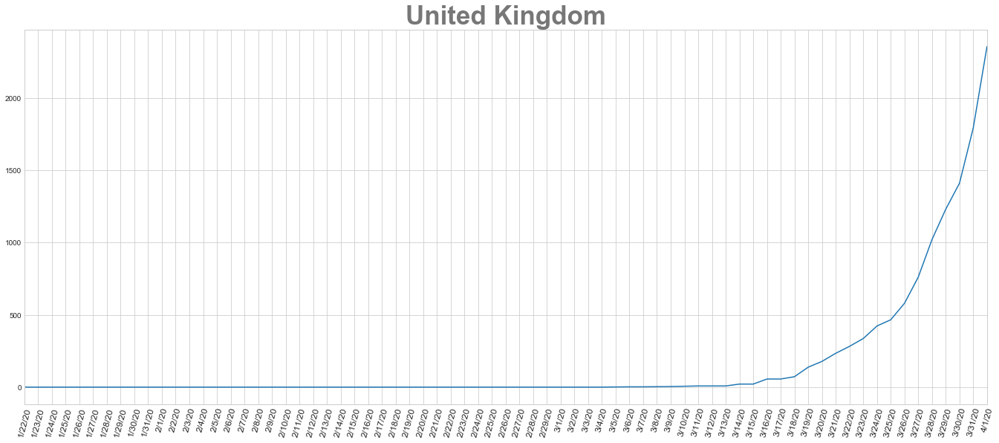

In [29]:
plt.style.use('seaborn-whitegrid')
fig= plt.figure(figsize=(18,7))

axes= fig.add_axes([0,0,1,1])

axes.plot(sum_deaths_country.loc['United Kingdom'])
plt.title('United Kingdom', color='#777777', size=35, weight=800)
plt.margins(x=0)
plt.xticks(rotation=75, size=12)

plt.show()

#plotting covid-19 deaths in UK 

# Map Visualisations

Visualisations to understand the geopgraphical spread of the virus and the most impacted countries and regions with regards to confirmed cases, deaths and recoveries. 

In [30]:
fig = px.scatter_geo(deaths, lat="Lat", lon="Long", color="Country/Region",
                     hover_name="Country/Region", size=deaths.iloc[:,-1],
                     projection="natural earth", opacity=0.6, size_max=70, scope='world',
                     title='Covid-19 Deaths')
fig.show()

fig1 = px.scatter_geo(confirmed, lat="Lat", lon="Long", color="Country/Region",
                     hover_name="Country/Region", size=confirmed.iloc[:,-1],
                     projection="natural earth", opacity=0.6, size_max=70, scope='world',
                     title='Confirmed Cases of Covid-19')
fig1.show()

fig2 = px.scatter_geo(recovered, lat="Lat", lon="Long", color="Country/Region",
                     hover_name="Country/Region", size=recovered.iloc[:,-1],
                     projection="natural earth", opacity=0.6, size_max=70, scope='world', 
                      title='Recoveries From Covid-19')
fig2.show()

### Preparing and Formating Dataframes to allow for animation

In [31]:
confirmed_top_20 = sum_confirmed_country.sort_values(by='3/28/20', ascending=False).head(20)
confirmed_top_20.head(5)

#countries with most covid-19 cases sorted by which have the most cases to date

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
US,1,1,2,2,5,5,5,5,5,7,...,43847,53740,65778,83836,101657,121478,140886,161807,188172,213372
Italy,0,0,0,0,0,0,0,0,0,2,...,63927,69176,74386,80589,86498,92472,97689,101739,105792,110574
China,548,643,920,1406,2075,2877,5509,6087,8141,9802,...,81498,81591,81661,81782,81897,81999,82122,82198,82279,82361
Spain,0,0,0,0,0,0,0,0,0,0,...,35136,39885,49515,57786,65719,73235,80110,87956,95923,104118
Germany,0,0,0,0,0,1,4,4,4,5,...,29056,32986,37323,43938,50871,57695,62095,66885,71808,77872


In [32]:
numbers_confirmed = list(range(len(confirmed_top_20.columns)))

#this allows for animation of barchart as need list of chronological numbers not dates to iterate over 
#here I'm creating a list chronological numbers of length of the number of rows

In [33]:
confirmed_top_20.columns = numbers_confirmed


#this allows for animation of barchart as need list of chronological numbers not dates to iterate over 
#here I am putting the list created above as the column headers

In [34]:
deaths_top_20 = sum_deaths_country.sort_values(by='3/28/20', ascending=False).head(20)
deaths_top_20.head(5)

#countries with most covid-19 deaths sorted by which have the most deaths to date

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Italy,0,0,0,0,0,0,0,0,0,0,...,6077,6820,7503,8215,9134,10023,10779,11591,12428,13155
Spain,0,0,0,0,0,0,0,0,0,0,...,2311,2808,3647,4365,5138,5982,6803,7716,8464,9387
China,17,18,26,42,56,82,131,133,171,213,...,3274,3281,3285,3291,3296,3299,3304,3308,3309,3316
Iran,0,0,0,0,0,0,0,0,0,0,...,1812,1934,2077,2234,2378,2517,2640,2757,2898,3036
France,0,0,0,0,0,0,0,0,0,0,...,862,1102,1333,1698,1997,2317,2611,3030,3532,4043


In [35]:
numbers_deaths = list(range(len(deaths_top_20.columns)))

#this allows for animation of barchart as need list of chronological numbers not dates to iterate over 
#here I'm creating a list chronological numbers of length of the number of rows

In [36]:
deaths_top_20.columns = numbers_deaths

#this allows for animation of barchart as need list of chronological numbers not dates to iterate over 
#here I am putting the list created above as the column headers

# Animating Bar Charts - Work In Progress!

The Bar Chart 'races' below visualise confirmed Cases and Deaths in most afflicted countries over time
- working on removing the static bar chart below the animation

In [37]:
#POTENTIAL FIX FOR ISSUES IN ANIMATION CHART: WIP!

lister = []
for row in sum_deaths_country.itertuples():
    fx = pd.DataFrame(row)
    fx['name'] = fx.iloc[0,0]
    fx = fx.iloc[1:]
    fx['year'] = sum_deaths_country.columns
    lister.append(fx)

for_animation = pd.concat(lister)
for_animation = for_animation.rename(columns={0: "value"})   

In [38]:
def animated_chart_cases(xyz):
        confirmed_top_20_order = confirmed_top_20.sort_values(by=(xyz),ascending=False)
        ax.clear()
        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
        ax.xaxis.set_ticks_position('top')
        ax.set_xlabel("Number of Covid-19 Cases")
        ax.set_ylabel("Top 20 Countries for Covid-19 Cases")
        ax.tick_params(axis='x', colors='#777777', labelsize=12)
        ax.set_yticklabels(confirmed_top_20_order.index)
        ax.barh(confirmed_top_20_order.index, confirmed_top_20_order[xyz], color='#eafb50')
        ax.text(0, 1.06, 'Confrimed Covid-19 Cases', transform=ax.transAxes, size=15, color='#000000', weight=800)
        ax.text(1, 1.05, 'by Paul Artunudaga', transform=ax.transAxes, ha='right',
            color='#000000', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
        ax.set_title(sum_confirmed_country.columns[xyz], color='#777777', size=35, weight=800)
        
#create function for covid-19 cases animated bar chart

In [39]:
plt.rcParams["animation.html"] = "jshtml"

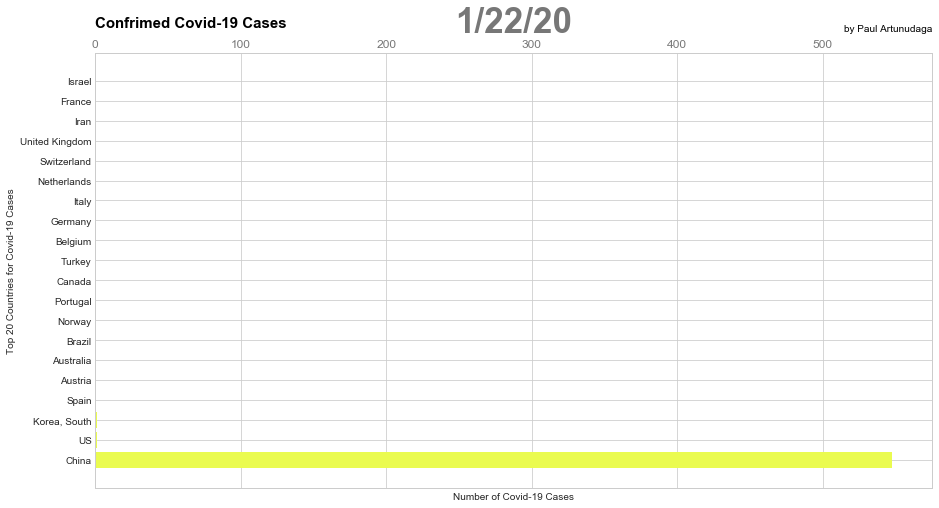

In [41]:
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, animated_chart_cases, frames=range(len(confirmed_top_20.columns)))
HTML(animator.to_jshtml())

#call function

In [72]:
def animated_chart_deaths(xyz):
        ax.clear()
        deaths_top_20_order=deaths_top_20.sort_values(by=(xyz),ascending=False)
        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
        ax.xaxis.set_ticks_position('top')
        ax.set_xlabel("Number of Covid-19 Cases")
        ax.set_ylabel("Top 20 Countries for Covid-19 Deaths")
        ax.tick_params(axis='x', colors='#777777', labelsize=12)
        ax.set_yticklabels(deaths_top_20.index)
        ax.barh(deaths_top_20_order.index, deaths_top_20_order[xyz], color='#8B0000')
        ax.text(0, 1.06, 'Covid-19 Deaths', transform=ax.transAxes, size=15, color='#000000', weight=800)
        ax.set_title(sum_deaths_country.columns[xyz], color='#777777', size=35, weight=800)
        ax.text(1, 1.05, 'by Paul Artunudaga', transform=ax.transAxes, ha='right',
            color='#000000', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
        ax.grid(which='major', axis='x', linestyle='-')
        plt.box(False)
        
#create function for covid-19 deaths animated bar chart

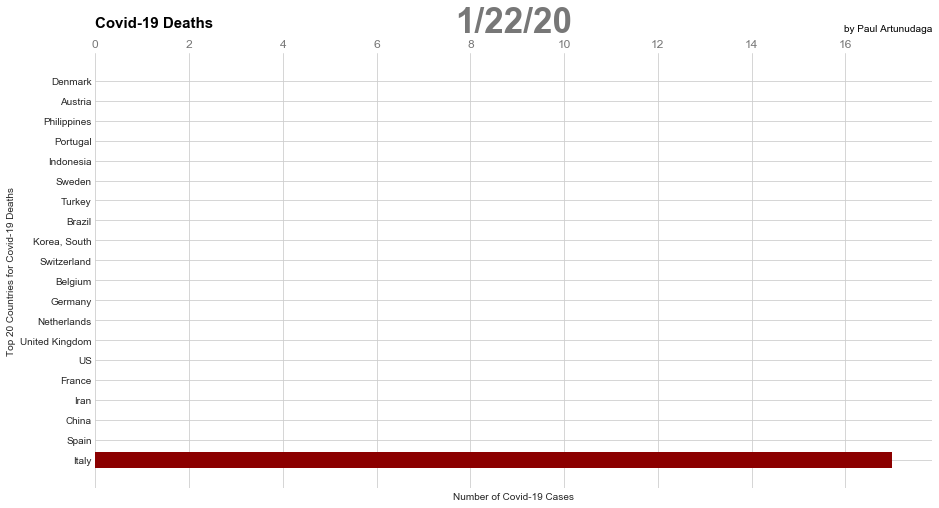

In [73]:
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, animated_chart_deaths, frames=range(len(deaths_top_20.columns)))
HTML(animator.to_jshtml())

#call function

# Index Data

Everytime the notebook is run, the latest FTSE 100 data will be automatically appended to this table - consistent with the format seen below.

In [44]:
timeseries = pd.concat(listy, axis=1)

#each snapshot of index data has been saved as a separate dataframe - here I join them together into one dataframe

In [45]:
timeseries.head(10) 

,Last,High,Low,Chg.,Chg.%,2020-04-02
Index,,,,,,
Dow 30,"20,943.51","21,487.24","20,784.43",-973.65,-4.44%,01/04
S&P 500,"2,470.50","2,522.75","2,447.49",-114.09,-4.41%,01/04
Nasdaq,"7,360.58","7,566.37","7,301.98",-339.52,-4.41%,01/04
SmallCap 2000,"1,068.24","1,127.73","1,064.60",-84.86,-7.36%,01/04
S&P 500 VIX,52.69,54.49,52.55,-4.37,-7.66%,13:02:04
S&P/TSX,"12,876.37","13,138.05","12,813.98",-502.38,-3.76%,01/04
Bovespa,"70,966.70","73,010.78","69,568.56",-2053.06,-2.81%,01/04
S&P/BMV IPC,"33,691.88","34,118.00","33,443.52",-862.65,-2.50%,01/04
DAX,"9,577.75","9,612.25","9,496.75",+33.00,+0.35%,13:02:17


# FTSE 100 Historic Data

Visualisaing FTSE 100 data since the outbreak of the corona virus - specifically since confirmed cases in China surpassed 500.

NOTE: Ths data was downloaded from the internet and saved locally - I have step up a scraper at the end of the notebook which will feed live data into the notebook.

In [46]:
ftse_historic = pd.read_excel(r'Desktop/Market_Insider_FTSE_Historic.xlsx')

#import historic data from local machine

In [47]:
ftse_historic_closing = ftse_historic[['DATE','CLOSING PRICE']]

#select only relevant column - in this case I am looking at closing price

In [48]:
ftse = ftse_historic_closing[14:]

#selecting data since 22nd January

In [49]:
ftse = ftse.drop(["DATE"], axis = 1)

#dropping data column to bring in new one with better readability on a graph

In [50]:
dates = pd.bdate_range(start="2020-01-22",end="2020-03-27")

#bring in new dates column

In [51]:
ftse.index = dates

#bring in new dates column

/opt/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning:

Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()



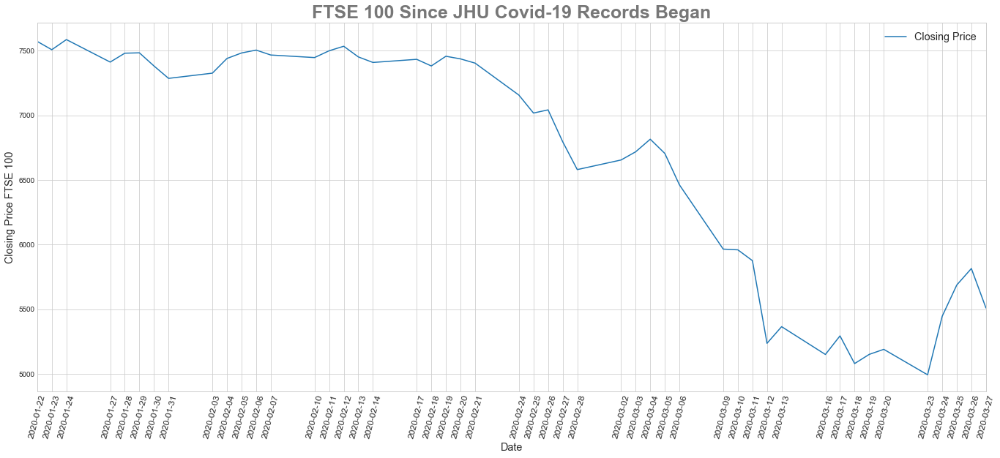

In [52]:
plt.style.use('seaborn-whitegrid')
fig= plt.figure(figsize=(18,7))

axes= fig.add_axes([0,0,1,1])

axes.plot(ftse, label='Closing Price')
plt.title('FTSE 100 Since JHU Covid-19 Records Began', color='#777777', size=25, weight=800)
plt.margins(x=0)
plt.xticks(rotation=75, size=12, ticks=ftse.index)
plt.xlabel("Date", fontsize='x-large')
plt.ylabel("Closing Price FTSE 100", fontsize='x-large')
plt.legend(loc='upper right', fontsize='x-large')


plt.show()

#visualise FTSE 100 closing price since 22nd January - ie. since start of John Hopkins Covid-19 Data 

### Scraping Live Index Data From Yahoo Finance

In [53]:
req1 = Request('https://finance.yahoo.com/quote/%5EFTSE%3FP%3DFTSE/history/', headers={'User-Agent': 'Mozilla/5.0'})
ftse = urlopen(req1).read()

#scrape data from https://finance.yahoo.com

In [54]:
soup = BeautifulSoup(ftse, 'lxml')
type(soup)

#create beautiful soup object

bs4.BeautifulSoup

In [55]:
rows = soup.find_all('tr')
for row in rows:
    row_td = row.find_all('td')
    
#parse HTML

In [56]:
str_cells = str(row_td)
cleantext = BeautifulSoup(str_cells, "lxml").get_text()
list_rows = []
for row in rows:
    cells = row.find_all('td')
    str_cells = str(cells)
    clean = re.compile('<.*?>')
    clean2 = (re.sub(clean, '',str_cells))
    list_rows.append(clean2)
    
#parse HTML

In [57]:
col_labels = soup.find_all('th')
ftse1 = pd.DataFrame(list_rows)

#parse HTML file

In [58]:
ftse2 = ftse1[0].str.split(', ', expand=True)

#split into columns

In [59]:
ftse3 = ftse2[1:-1] 

#drop unnecessary rows

In [60]:
ftse3 = ftse3.iloc[:,0:4]

#drop unnecessary columns

In [61]:
ftse3 = ftse3.drop(columns=[1])

#drop unnecessary columns

In [62]:
ftse3[0] = ftse3[0].str.replace('[', '') 
ftse3[2] = ftse3[2].str.replace(',', '')
ftse3[3] = ftse3[3].str.replace(',', '') 

#clean up strings

In [63]:
ftse3 = ftse3.rename({0: 'Date', 2: 'Opening', 3: 'Closing'}, axis=1)

#change column header names

In [64]:
ftse3['Opening'] = pd.to_numeric(ftse3["Opening"], downcast="float")
ftse3['Closing'] = pd.to_numeric(ftse3["Closing"], downcast="float")

#convert datatype to float

In [65]:
ftse3 = ftse3.iloc[::-1] 

#invert to chronological order

In [66]:
recents = ftse3.tail(51)
recents

#visualise table for last 50 days 

,Date,Opening,Closing
51,Jan 23,7571.899902,7572.100098
50,Jan 24,7507.700195,7642.200195
49,Jan 27,7586.000000,7586.000000
48,Jan 28,7412.100098,7491.399902
47,Jan 29,7480.700195,7514.700195
46,Jan 30,7483.600098,7483.600098
45,Jan 31,7382.000000,7398.299805
44,Feb 03,7286.000000,7360.000000
43,Feb 04,7326.299805,7442.100098
42,Feb 05,7439.799805,7512.399902


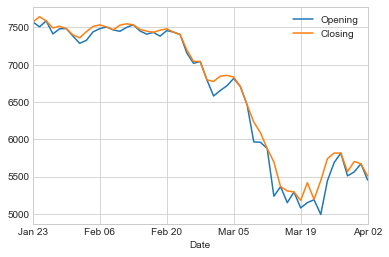

In [67]:
recents.plot(x='Date', y=["Opening", "Closing"])

#closing and opening FTSE 100 since January 22 - ie start of John Hopkins Covid-19 dataset